In [37]:
import numpy as np
import pickle
import os
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.ticker as ticker
import geopandas as gpd
from scipy.stats import variation,zscore
import math
from matplotlib import colors as cm
import matplotlib.dates as mdates

1. load simulations and observations

In [38]:
folder = 'seed_759826_nMul_16_wMul_True_out_T_wLAI_0.5_snow_NN_False_model_type_EXP-BGM_t_0425-1410'
gs_LAI = False  # calculate metrics for LAI on the scale of growing season  or the whole year

# determine training, validation, and test sets
with open(os.path.join(f'../checkpoints/{folder}', 'config.json'), 'r') as f:
    config = json.load(f)
trn_period, val_period, tst_period = config['data']['periods']
trn_period = pd.date_range(trn_period[0], trn_period[1])
val_period = pd.date_range(val_period[0], val_period[1])
tst_period = pd.date_range(tst_period[0], tst_period[1])

# load simulation
with open(os.path.join(f'../checkpoints/{folder}', 'simulation.pkl'), 'rb') as f:
    simulation = pickle.load(f)
# get simulated streamflow
area = {'HHY': 20930, 'JIM': 45019, 'JUG': 98414, 'MAQ': 86048, 'MET': 59655, 'TNH': 121972}
sim_Q = pd.DataFrame(simulation['Qr'][[13, 45, 53, 35, 23, 0]].T, columns=['HHY', 'JIM', 'MET', 'MAQ', 'JUG', 'TNH'], index=pd.date_range(val_period[0], tst_period[-1]))
sim_Q = sim_Q[sim_Q.index.isin(tst_period)]
# get simulated LAI
sim_LAI = pd.DataFrame(simulation['LAI'].T, columns=[f'basin_{i}' for i in range(0, 69)], index=pd.date_range(val_period[0], tst_period[-1]))
sim_LAI = sim_LAI[sim_LAI.index.isin(tst_period)]

# load observed streamflow and LAI
obs_Q = pd.read_csv('../data/streamflow.csv', index_col='DATE', parse_dates=True)
obs_Q = obs_Q[obs_Q.index.isin(tst_period)]
# obs_LAI = pd.read_csv('../data/lai_gimms.csv', index_col=0, header=0, parse_dates=True)
obs_LAI = pd.read_csv('../data/LAI.csv', index_col=0, header=0, parse_dates=True)
obs_LAI = obs_LAI[obs_LAI.index.isin(tst_period)]

2. visualize streamflow simulation

In [39]:
def evalFn(true: np.ndarray, pred: np.ndarray):
    # calculate nse
    numerator = np.sum((pred - true) ** 2)
    denominator = np.sum((true - np.mean(true)) ** 2)
    nse = 1 - numerator / denominator
    # calculate pearson's correlation coefficient
    r = np.corrcoef(pred, true)[0, 1]
    # calculate the percent bias
    pBias = 100 * (pred - true).sum() / true.sum()
    # calculate KGE
    beta = np.mean(pred) / np.mean(true)
    gamma = (np.std(pred) / np.mean(pred)) / (np.std(true) / np.mean(true))
    kge = 1 - np.sqrt((r - 1) ** 2 + (beta - 1) ** 2 + (gamma - 1) ** 2)
    # calculate RMSE
    rmse = np.sqrt(np.mean((pred - true) ** 2))
    # calculate log nse
    predLog, trueLog = np.log10(pred + 0.1), np.log10(true + 0.1)
    numerator = np.sum((predLog - trueLog) ** 2)
    denominator = np.sum((trueLog - np.mean(trueLog)) ** 2)
    nseLog = 1 - numerator / denominator
    return nse, r, pBias, kge, rmse, nseLog

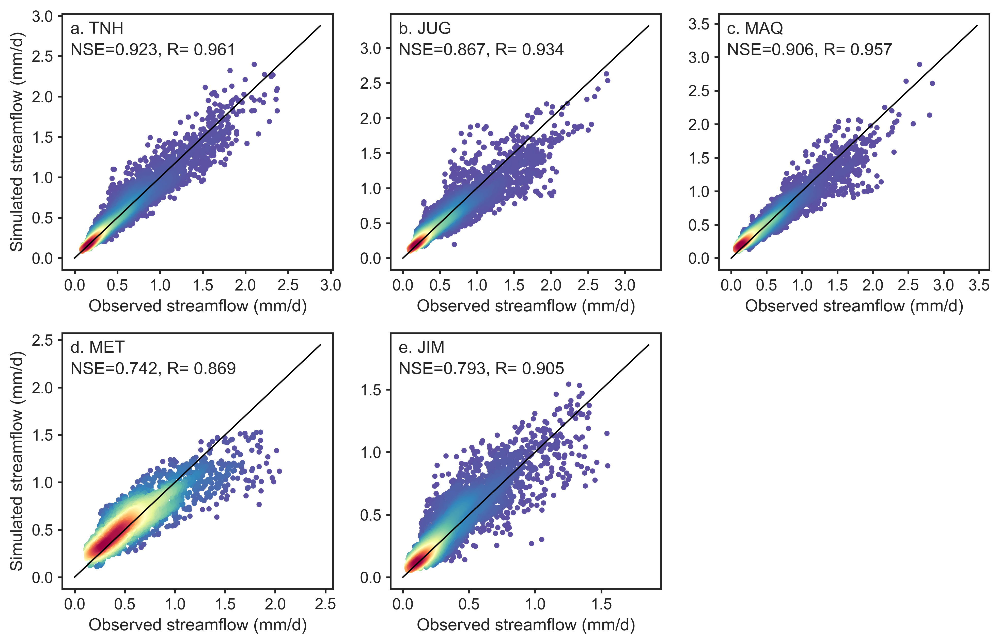

In [40]:
custom_params = {
    # 'axes.spines.right': False,
    # 'axes.spines.top': False,
    'xtick.major.size': 3,
    'ytick.major.size': 3,
}
sns.set_theme(style='ticks', rc=custom_params)
fig = plt.figure(figsize=(10, 6.5), dpi=400)
for i, station in enumerate(list(sim_Q.columns)[::-1][:-1]):
    # calculate metrics
    unit = 24 * 3600 / (area[station] * 1000)
    pred, true = sim_Q.loc[:, station] * unit, obs_Q.loc[:, station] * unit
    if station == 'MET':
        pred = pred[(pred.index.month >= 5) & (pred.index.month <= 10)]
        true = true[(true.index.month >= 5) & (true.index.month <= 10)]
    # drop nan value
    pred.name, true.name = 'pred', 'true'
    dfTemp = pd.concat([pred, true], axis=1)
    dfTemp.dropna(inplace=True)
    nse, r, pbias, kge, rmse, nseLog = evalFn(true=dfTemp['true'].values, pred=dfTemp['pred'].values)

    # plot scatters
    ax = fig.add_subplot(2, 3, i+1)
    x, y = dfTemp['true'].values, dfTemp['pred'].values
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x_plot, y_plot, z_plot = x[idx], y[idx], z[idx]
    ylim_max = max(x_plot.max(), y_plot.max())
    ax.plot(np.linspace(0, ylim_max * 1.2), np.linspace(0, ylim_max * 1.2), color='black', lw=1) # 1:1 line
    scatter = ax.scatter(x_plot, y_plot, c=z_plot, edgecolors=['None'], s=14, cmap='Spectral_r')

    # adjust format
    if i % 3 == 0:
        ax.set_ylabel('Simulated streamflow (mm/d)')
    ax.set_xlabel('Observed streamflow (mm/d)')
    ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.5))

    # annotation
    text = f'{chr(97+i)}. {station}\nNSE={nse:.3f}, R={r: .3f}'
    ax.annotate(text, xy=(0.03, 0.84), xycoords='axes fraction', linespacing=1.5)

    plt.tight_layout()
    plt.savefig(f'../checkpoints/{folder}/streamflow.png')

3. visualize LAI performance

In [41]:
# resample simulated LAI to match the observed LAI
df_sim = pd.DataFrame(index=obs_LAI.index, columns=obs_LAI.columns, dtype='float')
for i in range(len(obs_LAI.index)):
    if i == len(obs_LAI.index) - 1:
        start_date = obs_LAI.index[i]
        df_sim.loc[start_date] = sim_LAI.loc[start_date:, :].mean(axis=0)
    else:
        start_date = obs_LAI.index[i]
        end_date = obs_LAI.index[i+1]
        df_sim.loc[start_date] = sim_LAI.loc[start_date:end_date, :].mean(axis=0)

# calculate metrics for each sub-basin
df_metric = pd.DataFrame(index=obs_LAI.columns, columns=['NSE', 'R'], dtype='float')
if gs_LAI:
    df_sim = df_sim[(df_sim.index.month >= 5) & (df_sim.index.month <= 10)]
    df_obs = obs_LAI[(obs_LAI.index.month >= 5) & (obs_LAI.index.month <= 10)]
else:
    df_sim = df_sim[(df_sim.index.month >= 1) & (df_sim.index.month <= 12)]
    df_obs = obs_LAI[(obs_LAI.index.month >= 1) & (obs_LAI.index.month <= 12)]
for column in obs_LAI.columns:
    nse, r, pbias, kge, rmse, nseLog = evalFn(true=df_obs.loc[:, column].values, pred=df_sim.loc[:, column].values)
    df_metric.loc[column, 'NSE'], df_metric.loc[column, 'R'] = nse, r

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Get YellowGreen color map
cmap_spectral = plt.get_cmap('Spectral')
N = cmap_spectral.N
colors_spectral = cmap_spectral(np.linspace(0, 1, N))
mid_point = N // 2
yeGr = colors_spectral[mid_point:]
yeGr = LinearSegmentedColormap.from_list('YellowGreen', yeGr)

# Get YellowRed color map
cmap_spectral = plt.get_cmap('Spectral_r')
N = cmap_spectral.N
colors_spectral = cmap_spectral(np.linspace(0, 1, N))
mid_point = N // 2
yeRed = colors_spectral[mid_point:]
yeRed = LinearSegmentedColormap.from_list('YellowRed', yeRed)

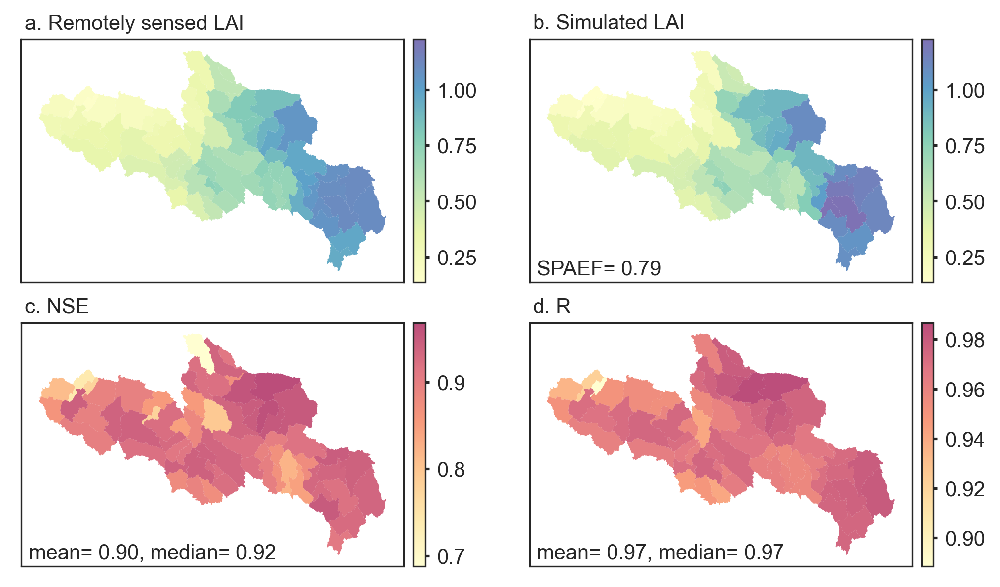

In [43]:
basins = gpd.read_file('../data/sub-basins/watershed.shp')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(7, 4), dpi=300)

# calculate data to plot
basins.loc[:, 'Remotely sensed LAI'] = df_obs.mean(axis=0).values
basins.loc[:, 'Simulated LAI'] = df_sim.mean(axis=0).values
basins.loc[:, 'NSE'] = df_metric.loc[:, 'NSE'].values
basins.loc[:, 'R'] = df_metric.loc[:, 'R'].values

for j, item in enumerate(['Remotely sensed LAI', 'Simulated LAI', 'NSE', 'R']):
    cmap = yeGr if j < 2 else yeRed
    ax = axes[j//2, j%2]
    if item in ['Remotely sensed LAI', 'Simulated LAI']:
        vmin = min(basins.loc[:, 'Remotely sensed LAI'].min(), basins.loc[:, 'Simulated LAI'].min())
        vmax = max(basins.loc[:, 'Remotely sensed LAI'].max(), basins.loc[:, 'Simulated LAI'].max())
        basins.plot(column=item, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1, vmin=vmin, vmax=vmax, alpha=0.8)
    else:
        vmin, vmax = basins.loc[:, item].values.min(), basins.loc[:, item].values.max()
        basins.plot(column=item, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1, vmin=vmin, vmax=vmax, alpha=0.7)

    ax.set_xticks([])
    ax.set_yticks([])

    # Set axis spines properties
    lw = 0.8
    ax.spines['top'].set_linewidth(lw)  # Top spine thickness
    ax.spines['bottom'].set_linewidth(lw)  # Bottom spine thickness
    ax.spines['left'].set_linewidth(lw)  # Left spine thickness
    ax.spines['right'].set_linewidth(lw)  # Right spine thickness

    ax.annotate(f'{chr(97+j)}. {item}', xy=(0.01, 1.04), xycoords='axes fraction', fontsize=10)
    # calculate spatial similarity
    if item == 'Simulated LAI':
        obs, sim = basins.loc[:, 'Remotely sensed LAI'].values, basins.loc[:, item].values
        alpha = np.corrcoef(obs, sim)[0, 1]
        beta = variation(sim) / variation(obs)
        bins = int(np.around(math.sqrt(len(obs)), 0))
        hobs, _ = np.histogram(zscore(obs),bins)
        hsim, _ = np.histogram(zscore(sim),bins)
        gamma = np.minimum(hobs, hsim).sum() / hobs.sum()
        spaEF = 1 - np.sqrt((alpha - 1) ** 2 + (beta - 1) ** 2 + (gamma - 1) ** 2)
        ax.annotate(f'SPAEF={spaEF: .2f}', xy=(0.02, 0.03), xycoords='axes fraction', fontsize=10)
    elif item in ['NSE', 'R']:
        mean, median = basins.loc[:, item].mean(), basins.loc[:, item].median()
        ax.annotate(f'mean={mean: .2f}, median={median: .2f}', xy=(0.02, 0.03), xycoords='axes fraction', fontsize=10)
    norm = cm.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    if item in ['Remotely sensed LAI', 'Simulated LAI']:
        cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=1, pad=0.02, alpha=0.8)
    else:
        cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=1, pad=0.02, alpha=0.7)

    cbar.ax.tick_params(direction='out', length=2, labelsize=10)
    cbar.outline.set_linewidth(lw)

plt.subplots_adjust(wspace=0.05, hspace=0.01)
plt.tight_layout()
plt.savefig(f'../checkpoints/{folder}/LAI.png')

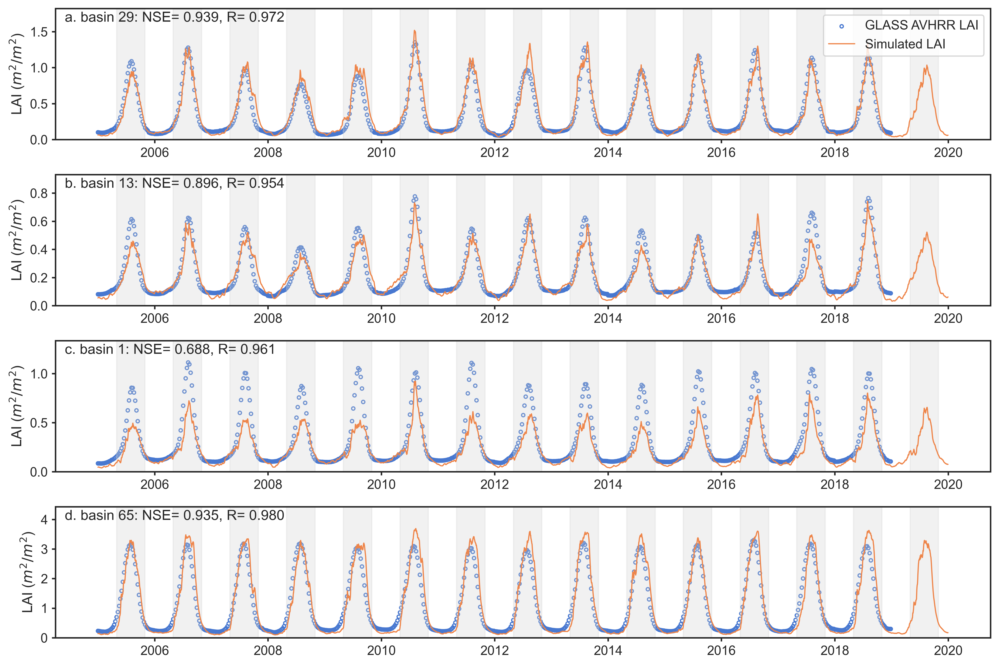

In [44]:
fig = plt.figure(figsize=(12, 8), dpi=400)
basin_ids = [29, 13, 1, 65]
colors = sns.color_palette('muted', n_colors=2)
for i, basin_id in enumerate(basin_ids):
    ax = fig.add_subplot(4, 1, i+1)
    # ax.plot(obs_LAI.loc[:, f'basin_{basin_id}'], label='GLASS AVHRR LAI', linewidth=1, color=colors[0])
    ax.scatter(obs_LAI.index, obs_LAI.loc[:, f'basin_{basin_id}'].values, label='GLASS AVHRR LAI', marker='o', edgecolors=colors[0], c='None', s=8)
    ax.plot(sim_LAI.loc[:, f'basin_{basin_id}'], label='Simulated LAI', linewidth=1, color=colors[1])
    # Highlight May to October for each year
    ylim_max = max(obs_LAI.loc[:, f'basin_{basin_id}'].max(), sim_LAI.loc[:, f'basin_{basin_id}'].max())
    ax.set_ylim(top=ylim_max * 1.2, bottom=0)
    for year in range(sim_LAI.index.year.min(), sim_LAI.index.year.max() + 1):
        start_date, end_date = pd.to_datetime(f'{year}-05-01'), pd.to_datetime(f'{year}-10-31')
        ax.fill_betweenx(y=[0, ylim_max * 1.2], x1=start_date, x2=end_date, color='lightgray', alpha=0.3)
    ax.set_ylabel('LAI ($m^2/m^2$)')
    ax.annotate(f"{chr(97+i)}. basin {basin_id}: NSE={df_metric['NSE'].values[basin_id]: .3f}, R={df_metric['R'].values[basin_id]: .3f}",
                xy=(0.01, 0.9), xycoords='axes fraction')
    if i == 0:
        ax.legend(loc='upper right')
    ax.xaxis.set_major_locator(mdates.YearLocator(2))
plt.tight_layout()
plt.savefig(f'../checkpoints/{folder}/LAI_series.png')

## visualize parameters related to LAI (paraKsg, paraWUE) and three state variables (Bg, NPP, Es)

In [45]:
num_static_para = config['staNet']['outFC'] - 2
num_dynamic_para = config['dynNet']['outLSTM']

if num_static_para == 7:
    para_dict = {'static': ['parTMIN', 'parDDF', 'parTMAX', 'parQMAX', 'parSMAX', 'parIMAX', 'parKS'],
                 'dynamic': ['parF', 'parALPHA', 'parRSUB', 'parKsg', 'parWUE']}
else:
    para_dict = {'static':  ['parTMIN', 'parDDF', 'parTMAX', 'parQMAX', 'parSMAX', 'parIMAX', 'parKS', 'parWUE'],
                 'dynamic': ['parF', 'parALPHA', 'parRSUB', 'parKsg']}

para_unit = {'parTMIN': '$^\circ$C', 'parDDF': 'mm/$^\circ$C/d', 'parTMAX': '$^\circ$C', 'parQMAX': 'mm/d', 'parSMAX': 'mm', 'parIMAX': 'mm',
             'parKS': '-', 'parF': '-', 'parALPHA': '-', 'parRSUB': '-', 'parKsg': 'd$^-1$', 'parWUE': 'kg CO2/kg H2O'}

parWMul = simulation['wMul']

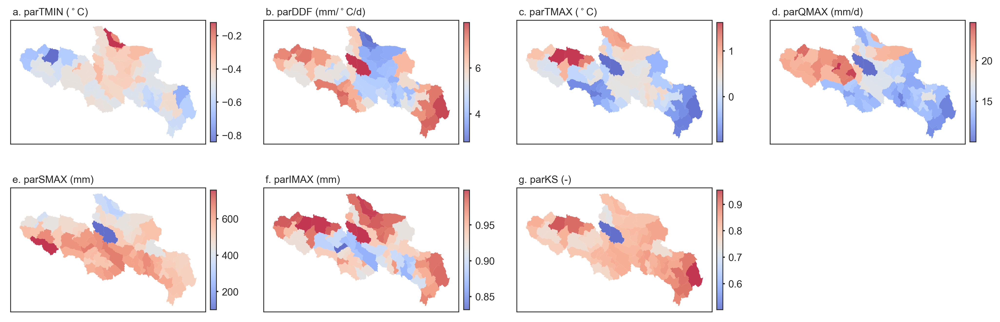

In [46]:
# plot static parameters
basins = gpd.read_file('../data/sub-basins/watershed.shp')
cmap = 'coolwarm'
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(14, 5), dpi=300)
for i, para_name in enumerate(para_dict['static']):
    ax = axes[i//4, i%4]
    para_value = (simulation['static'][:, :, i] * parWMul).sum(axis=1)
    basins.loc[:, para_name] = para_value
    basins.plot(column=para_name, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1, vmin=para_value.min(), vmax=para_value.max(), alpha=0.8)
    ax.set_xticks([])
    ax.set_yticks([])

    # Set axis spines properties
    lw = 0.8
    ax.spines['top'].set_linewidth(lw)  # Top spine thickness
    ax.spines['bottom'].set_linewidth(lw)  # Bottom spine thickness
    ax.spines['left'].set_linewidth(lw)  # Left spine thickness
    ax.spines['right'].set_linewidth(lw)  # Right spine thickness

    ax.annotate(f'{chr(97+i)}. {para_name} ({para_unit[para_name]})', xy=(0.01, 1.04), xycoords='axes fraction', fontsize=10)
    norm = cm.Normalize(vmin=para_value.min(), vmax=para_value.max())
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.7, pad=0.02, alpha=0.7)
    cbar.ax.tick_params(direction='out', length=2, labelsize=10)
    cbar.outline.set_linewidth(lw)

if num_static_para == 7:
    plt.delaxes(ax=axes[1, 3])

plt.subplots_adjust(wspace=0.05, hspace=0.01)
plt.tight_layout()
plt.savefig(f'../checkpoints/{folder}/static_paras.png')

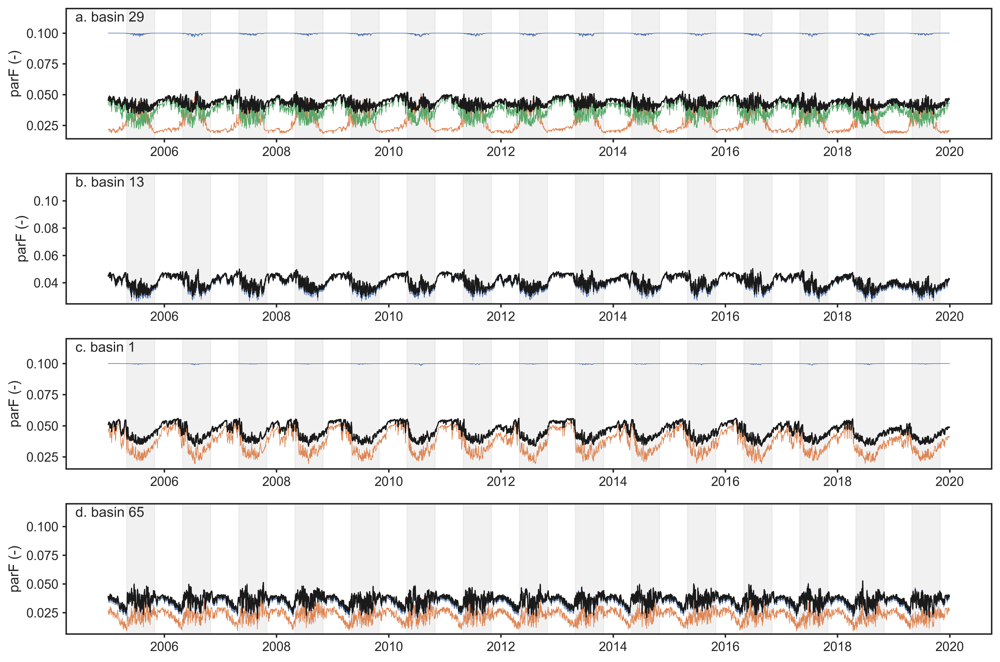

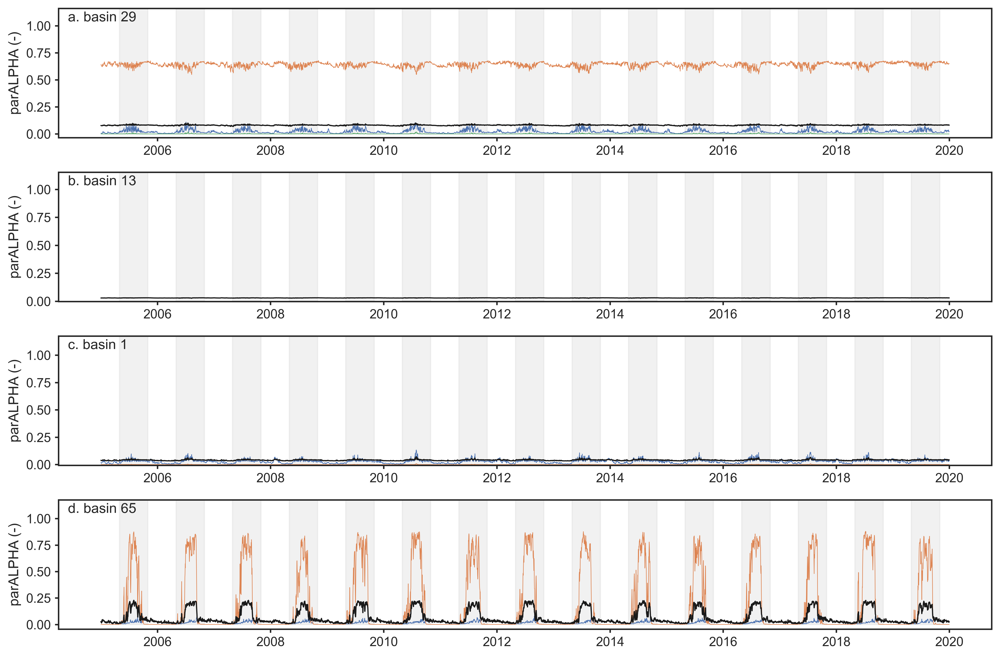

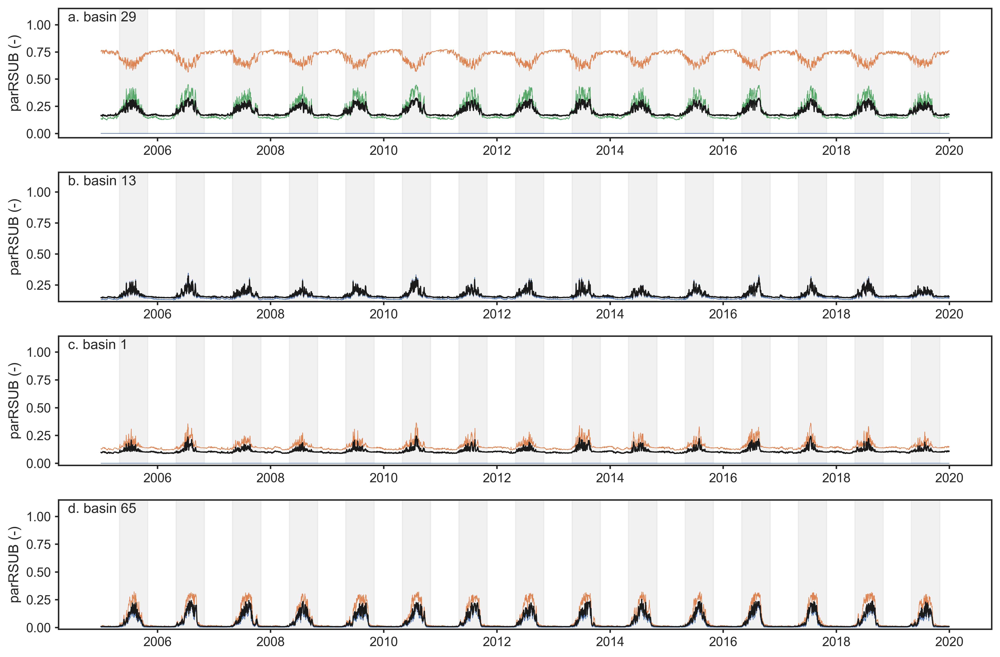

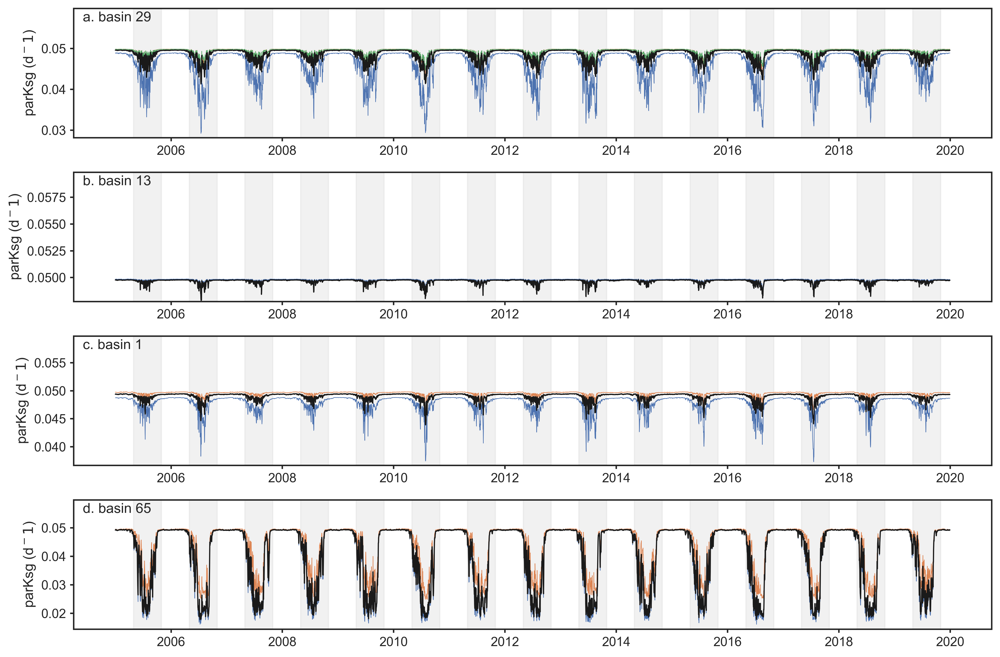

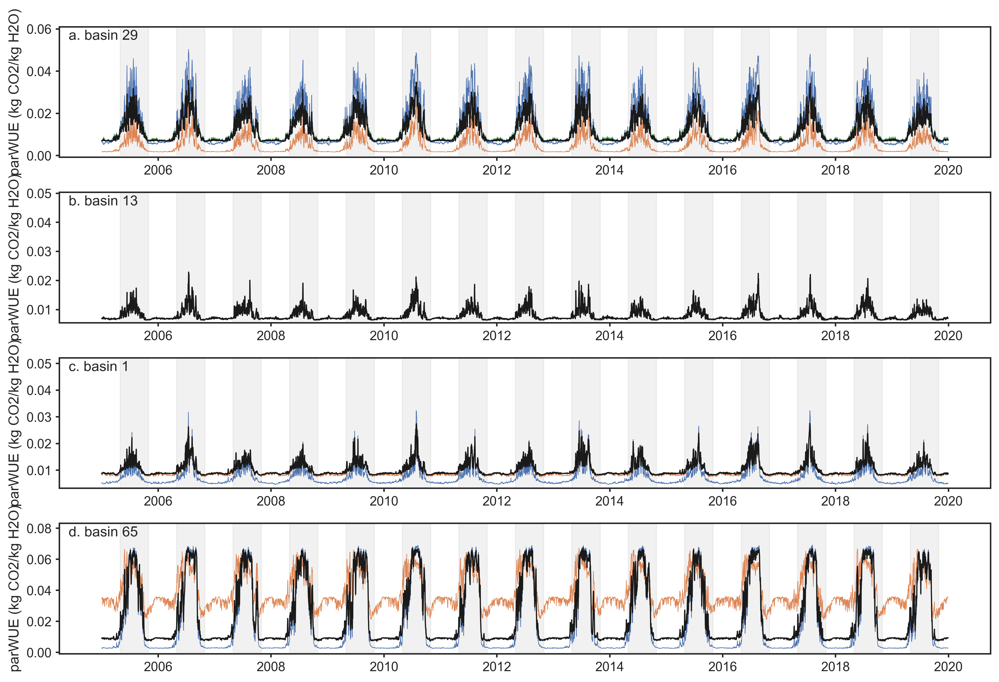

In [47]:
# plot dynamic parameters
basin_ids = [29, 13, 1, 65]
for i, para_name in enumerate(para_dict['dynamic']):
    para_value = simulation['dynamic'][:, :, :, i]
    fig = plt.figure(figsize=(12, 8), dpi=400)
    for j, basin_id in enumerate(basin_ids):
        ax = fig.add_subplot(4, 1, j+1)
        for k in range(para_value.shape[-1]):
            if parWMul[basin_id, k] > 0.1:
                ax.plot(tst_period, para_value[basin_id, :, k], linewidth=0.5)
            # ax.plot(tst_period, para_value[basin_id, :, k], linewidth=0.5)
        ax.plot(tst_period, (para_value[basin_id] * parWMul[basin_id]).sum(axis=-1), linewidth=1, color='k')
        ax.set_ylabel(f'{para_name} ({para_unit[para_name]})')
        ax.annotate(f"{chr(97+j)}. basin {basin_id}", xy=(0.01, 0.9), xycoords='axes fraction')
        ax.xaxis.set_major_locator(mdates.YearLocator(2))
        ylim_max = para_value[basin_id, :, :].max()
        ax.set_ylim(top=ylim_max * 1.2)
        for year in range(sim_LAI.index.year.min(), sim_LAI.index.year.max() + 1):
            start_date, end_date = pd.to_datetime(f'{year}-05-01'), pd.to_datetime(f'{year}-10-31')
            ax.fill_betweenx(y=[0, ylim_max * 1.2], x1=start_date, x2=end_date, color='lightgray', alpha=0.3)
    fig.tight_layout()
    plt.savefig(f'../checkpoints/{folder}/dynamic_{para_name}.png')

In [48]:
# visualize the state variables
def get_state(var):
    df = pd.DataFrame(simulation[f'{var}'].T, columns=[f'basin_{i}' for i in range(0, 69)], index=pd.date_range(val_period[0], tst_period[-1]))
    df = df[df.index.isin(tst_period)]
    return df

unit_dict = dict(zip(['Ts', 'Ew', 'Bg', 'Ssl', 'Sss'], ['Transpiration (mm/d)', 'Snow sublimation (mm/d)', 'Green biomass', 'Liquid soil water (mm)', 'Solid soil water (mm)']))
state_dict = dict(zip(list(unit_dict.keys()), [get_state(var) for var in list(unit_dict.keys())]))

basin_ids = [29, 13, 1, 65]
colors = sns.color_palette('muted', n_colors=2)
for k, state in enumerate(state_dict.values()):
    fig = plt.figure(figsize=(12, 8), dpi=400)
    for i, basin_id in enumerate(basin_ids):
        ax = fig.add_subplot(4, 1, i+1)
        ax.plot(tst_period, state.loc[:, f'basin_{basin_id}'], linewidth=1)
        ax.set_ylabel(unit_dict[list(state_dict.keys())[k]])
        ax.annotate(f"{chr(97+i)}. basin {basin_id}", xy=(0.01, 0.9), xycoords='axes fraction')
        ax.xaxis.set_major_locator(mdates.YearLocator(2))
        ylim_max = state.loc[:, f'basin_{basin_id}'].max()
        ax.set_ylim(top=ylim_max * 1.2)
        for year in range(sim_LAI.index.year.min(), sim_LAI.index.year.max() + 1):
            start_date, end_date = pd.to_datetime(f'{year}-05-01'), pd.to_datetime(f'{year}-10-31')
            ax.fill_betweenx(y=[0, ylim_max * 1.2], x1=start_date, x2=end_date, color='lightgray', alpha=0.3)
    fig.tight_layout()
    plt.savefig(f'../checkpoints/{folder}/{list(state_dict.keys())[k]}.png')

KeyError: 'Ts'